In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import pandas as pd
import jax.numpy as jnp
import jax
import numpy as np
import matplotlib.pyplot as plt
from jax import grad, jit, vmap
import numpyro
from numpyro import distributions as dist
from numpyro import infer
from numpyro_ext import distributions as distx
from numpyro_ext import info, optim
numpyro.set_host_device_count(1)  # For multi-core parallelism (useful when running multiple MCMC chains in parallel)
numpyro.set_platform("cpu")  # For CPU (use "gpu" for GPU)
jax.config.update("jax_enable_x64", True)
jax.config.update("jax_debug_nans", True)

#jax.config.update('jax_disable_jit', True)
from jaxoplanet import light_curves, orbits
from jaxoplanet.orbits.keplerian import Central, Body, System
from jaxoplanet.units import unit_registry as ureg
from jaxoplanet import units
from matplotlib import rc
from astropy.table import Table
rc('font', **{'family':'sans-serif'})
rc('text', usetex=False)
rc('xtick', **{'top':True, 'direction':'in', 'major.width':1.0, 'minor.width':1.0})
rc('ytick', **{'right':True, 'direction':'in', 'major.width':1.0, 'minor.width':1.0})
rc('lines', **{'markeredgewidth':1.0})

yr = 365.25

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


## Pulling in the Hipparcos data
First, we get the single star solution as well as the epoch astrometry from the Intermediate Astrometry Data (IAD), available at [here](https://www.cosmos.esa.int/web/hipparcos/hipparcos-2) courtesy of Van Leeuwen and Michalik (2021). The IAD `EPOCH` column is the time in decimal years with the reference time 1991.25 subtracted. `PARF` is the parallax factor, `SPSI` is the sine of the scan angle, and `CPSI` is the cosine of the scan angle. `RES` lists the epoch astrometry with the single star solution subtracted from the data. `SRES` lists the error on those measurements.

In [2]:
header_name = 'RAdeg        DEdeg        Plx      pm_RA    pm_DE    e_RA   e_DE   e_Plx  e_pmRA e_pmDE dpmRA  dpmDE  e_dpmRA  e_dpmDE  ddpmRA  ddpmDE  e_ddpmRA  e_ddpmDE  upsRA   upsDE   e_upsRA  e_upsDE  var'.split()
full_data = pd.read_csv('H032607.d',header=None,names=header_name,delim_whitespace=True,skiprows=lambda x: x != 10)
plx = float(full_data['Plx']*1e-3) #get the mean hipparcos parallax from the header data
pm_ra = float(full_data['pm_RA']*1e-3) #get the mean hipparcos pm_ra from the header data
pm_dec = float(full_data['pm_DE']*1e-3) #get the mean hipparcos pm_dec from the header data
del_ra = float(full_data['RAdeg'])
full_data
plx,pm_ra,pm_dec

/var/folders/4b/sq0slnz147sfy_kz1_nwf6zh0000gn/T/ipykernel_14994/3930229568.py:3: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plx = float(full_data['Plx']*1e-3) #get the mean hipparcos parallax from the header data
/var/folders/4b/sq0slnz147sfy_kz1_nwf6zh0000gn/T/ipykernel_14994/3930229568.py:4: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pm_ra = float(full_data['pm_RA']*1e-3) #get the mean hipparcos pm_ra from the header data
/var/folders/4b/sq0slnz147sfy_kz1_nwf6zh0000gn/T/ipykernel_14994/3930229568.py:5: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pm_dec = float(full_data['pm_DE']*1e-3) #get the mean hipparcos pm_dec from the header data
/var/folders/4b/sq0slnz147sfy_kz1_nwf6zh0000gn/T

(0.033780000000000004, -0.06606999999999999, 0.24297)

In [3]:
header = 'IORB   EPOCH    PARF    CPSI    SPSI     RES   SRES'.split()
data = pd.read_csv('H032607.d',header=None,names=header,delim_whitespace=True,comment='#')
data

,IORB,EPOCH,PARF,CPSI,SPSI,RES,SRES
0,126,-1.2529,0.6682,-0.7110,-0.7032,-9.34,12.05
1,126,-1.2529,0.6665,-0.7121,-0.7021,-7.40,12.10
2,191,-1.1740,-0.6622,-0.3366,0.9417,-12.51,12.06
3,191,-1.1740,-0.6623,-0.3364,0.9417,-12.65,12.06
4,191,-1.1740,-0.6643,-0.3338,0.9427,-12.99,12.06
...,...,...,...,...,...,...,...
97,2511,1.6447,-0.6780,-0.9981,0.0617,-11.92,12.05
98,2671,1.8390,0.6608,-0.9845,-0.1754,-25.49,12.06
99,2671,1.8390,0.6621,-0.9842,-0.1772,-24.19,12.06
100,2671,1.8390,0.6593,-0.9849,-0.1733,-23.31,12.06


In [4]:
from astropy.time import Time
t = jnp.array(Time(jnp.array(data["EPOCH"]+1991.25).flatten(), format='decimalyear').jd)
#t = jnp.array() # time, BJD, TCB
t0 = Time(1991.25, format='decimalyear').jd # J1991.25
t -= t0
gof_ext = 0.07
w = jnp.array(data['RES']*1e-3) # along-scan position, arcsec
sres = jnp.array(data['SRES']) # uncertainty in the along-scan position, arcsec
DOF = len(t) - 6
disper_ext = 12.0

renorm_factor = (gof_ext * jnp.sqrt(2/(9*DOF)) + 1 - (2/(9*DOF)))**3
sig_w = renorm_factor * np.sqrt(sres**2 - disper_ext**2)*1e-3
pf = jnp.array(data['PARF']) # parallax factor

#psi = jnp.array(data.scan_pos_angle.values*jnp.pi/180) # scan position angle, radians
spsi = jnp.array(data['CPSI']) # sin of scan position angle
cpsi = jnp.array(data['SPSI']) # cos of scan position angle


In [185]:
t+t0

Array([2447891.44151154, 2447891.44151154, 2447920.24000088,
       2447920.24000088, 2447920.24000088, 2447920.24000088,
       2447947.76100175, 2447948.19900177, 2447948.19900177,
       2447977.5085027 , 2447977.5085027 , 2447977.5085027 ,
       2447977.5085027 , 2448004.59150355, 2448005.02950357,
       2448005.02950357, 2448061.82350537, 2448061.82350537,
       2448061.82350537, 2448061.82350537, 2448095.98750645,
       2448095.98750645, 2448095.98750645, 2448095.98750645,
       2448119.4570072 , 2448119.4570072 , 2448153.14650826,
       2448153.14650826, 2448153.14650826, 2448176.68900901,
       2448176.68900901, 2448176.68900901, 2448233.48301081,
       2448233.48301081, 2448233.48301081, 2448263.194     ,
       2448263.194     , 2448263.194     , 2448263.194     ,
       2448290.2405    , 2448290.2405    , 2448290.2405    ,
       2448319.55      , 2448319.55      , 2448347.0345    ,
       2448347.0345    , 2448347.0345    , 2448347.0345    ,
       2448347.0345    ,

In [5]:
fine_t = np.linspace(np.min(t),np.max(t),1000)
st = jnp.sin(2*jnp.pi*fine_t/yr)
ct = jnp.cos(2*jnp.pi*fine_t/yr)

Use the Hipparcos solution to compute the term to add back to the data below:

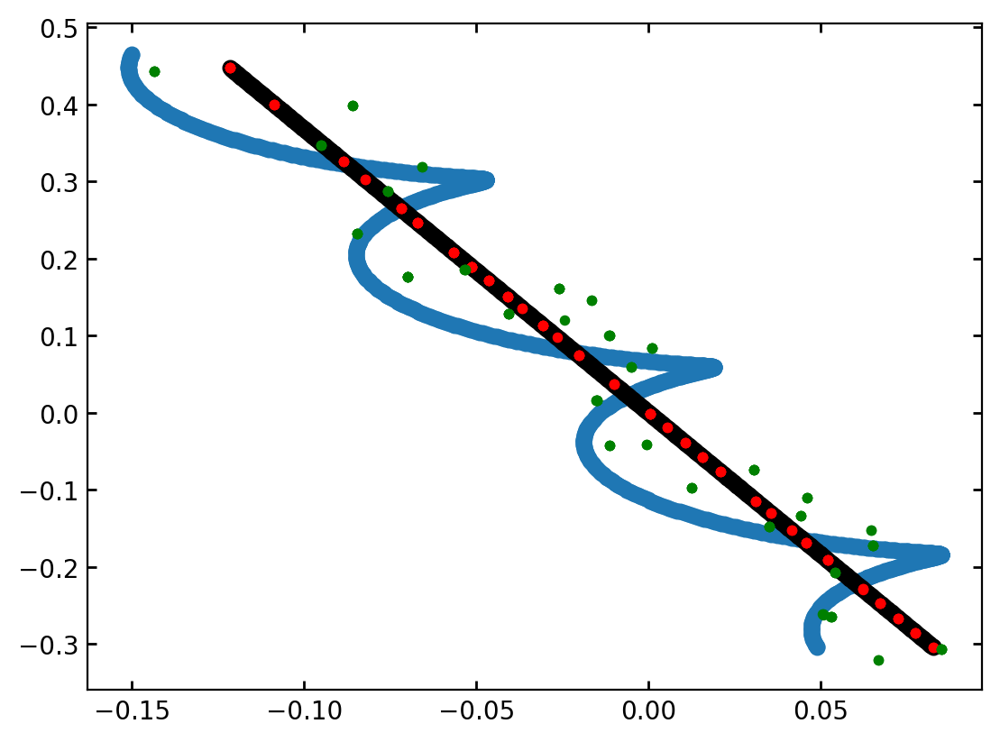

In [6]:
def single_star_soln(t, delta_ra, delta_dec, pm_ra, pm_dec, parallax, pf, spsi,cpsi):
    single_ra = (pm_ra*t/yr)*cpsi + delta_ra + parallax*pf*cpsi
    single_dec = (pm_dec*t/yr)*spsi + delta_dec + parallax*pf*spsi
    tot = ((pm_ra*t/yr)*spsi + (pm_dec*t/yr)*cpsi) + parallax*pf
    return tot
tot_meansoln = single_star_soln(t, 0.0, 0.0, pm_ra, pm_dec, plx, pf, spsi, cpsi)
plt.scatter((pm_ra*fine_t/yr)+ plx*st, (pm_dec*fine_t/yr)+ plx*ct,s=30)
plt.scatter(pm_ra*(fine_t)/yr, pm_dec*(fine_t)/yr,s=30,c='k')
plt.scatter(pm_ra*(t)/yr, pm_dec*(t)/yr,s=10,c='r')
plt.scatter(pm_ra*(t)/yr + plx*pf*spsi, pm_dec*(t)/yr + plx*pf*cpsi,s=10,c='green')

In [7]:
mstar = 2.0 # solar masses
rstar = 1.6 # solar radii; in exoplanet, both mstar and rstar are required, but rstar is inconsequential here

In [ ]:
import numpy as np
def mlr(m):
    return 4.85 - 14.2*jnp.log10(m) + 14.1*jnp.log10(m)**2 - 9.99*jnp.log10(m)**3 + 2.66*jnp.log10(m)**4
def mlrv(m):  #mass radius relation for 
    return 10**(0.4*(mlr(1.0)-mlr(m)))


In [243]:
def model(t, pf, spsi,cpsi, w, sig_w):

    ### Proper motion + parallax modeling ###

    # Stellar position offest
    delta_ra = numpyro.sample('delta_ra',dist.Normal(0., 0.2)) # ra*cos(dec), arcsec
    delta_dec = numpyro.sample('delta_dec',dist.Normal(0., 0.2)) # dec, arcsec

    # Stellar proper motion
    pm_ra = numpyro.sample('pm_ra',dist.Normal(0., 0.2)) # ra*cos(dec), arcsec/yr
    pm_dec = numpyro.sample('pm_dec',dist.Normal(0., 0.2)) # dec, arcsec/yr
    # Parallax
    log_parallax = numpyro.sample('log_parallax', dist.Normal(jnp.log(0.033), 5.0)) #arcsec
    parallax = numpyro.deterministic('parallax',jnp.exp(log_parallax)) # arcsec
    # Astrometric jitter
    log_sigma = numpyro.sample('log_sigma',dist.Normal(0.0,1.0))
    # Model prediction
    def single_star_as(t, delta_ra, delta_dec, pm_ra, pm_dec, parallax, pf, spsi,cpsi):
        single_ra = numpyro.deterministic('single_ra', pm_ra*t/yr + delta_ra + parallax*pf*spsi)
        single_dec = numpyro.deterministic('single_dec', pm_dec*t/yr + delta_dec + parallax*pf*cpsi)
        return (pm_ra*t/yr+delta_ra)*spsi + (pm_dec*t/yr+delta_dec)*cpsi + (parallax*pf)
    
    model_single = numpyro.deterministic('model_single', single_star_as(t, delta_ra, delta_dec, pm_ra, pm_dec, parallax, pf, spsi,cpsi))
    ### Binary modeling ###

    # Companion mass
    log_mp = numpyro.sample("log_mp", dist.Uniform(jnp.log(1e-3), jnp.log(1e3))) # solar masses
    mp = numpyro.deterministic('mp', jnp.exp(log_mp))

    #stellar mass
    ms = 1.6#numpyro.sample('ms',dist.Normal(2.0,0.3))

    # Period
    #log_p = numpyro.sample('log_p', dist.Uniform(jnp.log(1e2),jnp.log(1e4))) # days
    p = numpyro.sample('p', dist.Normal(1300,13))

    # Time of periastron passage
    phase_peri = numpyro.sample('phase_peri', dist.Uniform(-0.5,0.5)) #dist.Uniform(0.22018230854550275-0.1,0.22018230854550275+0.1))
    tp = numpyro.deterministic('tp', phase_peri*p)

    # Eccentricity and argument of periastron
    #hk = numpyro.sample('hk', distx.UnitDisk())
    ecc = numpyro.sample('ecc',dist.Normal(0.36,0.1))#numpyro.deterministic('ecc', hk[0]**2 + hk[1]**2)
    omega = numpyro.sample('omega', dist.Uniform(-0.13,-0.11))#numpyro.deterministic('omega', jnp.arctan2(hk[1], hk[0]))

    # Inclination
    cosi = numpyro.sample('cosi', dist.Uniform(-1.0,1.0)) # known retrograde orbit
    i = numpyro.deterministic('i', jnp.arccos(cosi))

    # Longitude of ascending node
    long_peri = numpyro.sample('long_peri', dist.Uniform(-jnp.pi,jnp.pi))

    # Define the orbit
    #i_ratio = numpyro.deterministic('i_ratio', 1.0 - (((mp/ms)**3.5)*(1+mp/ms))/((mp/ms)*(1. + (mp/ms)**3.5)))
    i_ratio = numpyro.deterministic('i_ratio', 1.0 - (((mlrv(mp)/mlrv(ms))*(1+mp/ms))/((mp/ms)*(1. + mlrv(mp)/mlrv(ms)))))
    host = Central(mass=ms,radius=rstar)
    Tsystem = System(host).add_body(period=p,mass=mp,time_peri=tp,inclination=i,eccentricity=ecc,omega_peri=omega,asc_node=long_peri,parallax=parallax)
    def binary_as(t, system):
        xs, ys, zs = Tsystem.central_position(t)

        ra = numpyro.deterministic('ra', ys.magnitude[0]*i_ratio)
        dec = numpyro.deterministic('dec', xs.magnitude[0]*i_ratio)

        # ys in RA direction and xs in Dec direction
        return (ys.magnitude[0]*spsi + xs.magnitude[0]*cpsi)*i_ratio
    
    model_binary = numpyro.deterministic('model_binary', binary_as(t, Tsystem))
    # Likelihood
    numpyro.sample('logl', dist.Normal(model_single + model_binary, jnp.sqrt(sig_w**2 + jnp.exp(log_sigma)**2)), obs=w)
    # For plotting
    t_plot = jnp.linspace(0, 5000, 1000)
    xs_plot, ys_plot, _ = Tsystem.central_position(t_plot)
    ra_plot = numpyro.deterministic('ra_plot', ys_plot.magnitude[0]*i_ratio)
    dec_plot = numpyro.deterministic('dec_plot', xs_plot.magnitude[0]*i_ratio)

In [244]:
import numpyro_ext.distributions, numpyro_ext.optim


run_optim = numpyro_ext.optim.optimize(model, return_info=True)


opt_params, status = run_optim(jax.random.PRNGKey(2), t, pf, spsi,cpsi, w+tot_meansoln, sig_w)

In [245]:
opt_params

{'delta_ra': Array(0.00397685, dtype=float64),
 'delta_dec': Array(-0.00266877, dtype=float64),
 'pm_ra': Array(-0.07275039, dtype=float64),
 'pm_dec': Array(0.27211555, dtype=float64),
 'log_parallax': Array(-3.38989142, dtype=float64),
 'log_sigma': Array(-6.00218084, dtype=float64),
 'log_mp': Array(-0.15043127, dtype=float64),
 'p': Array(1297.06808876, dtype=float64),
 'phase_peri': Array(0.17446528, dtype=float64),
 'ecc': Array(0.05466718, dtype=float64),
 'omega': Array(-0.13, dtype=float64),
 'cosi': Array(-0.59384325, dtype=float64),
 'long_peri': Array(-2.88094169, dtype=float64),
 'dec': Array([ 0.03036139,  0.03036139,  0.03192873,  0.03192873,  0.03192873,
         0.03192873,  0.0329324 ,  0.03294438,  0.03294438,  0.03345601,
         0.03345601,  0.03345601,  0.03345601,  0.03341629,  0.03341158,
         0.03341158,  0.03171038,  0.03171038,  0.03171038,  0.03171038,
         0.02966745,  0.02966745,  0.02966745,  0.02966745,  0.02784184,
         0.02784184,  0.02465

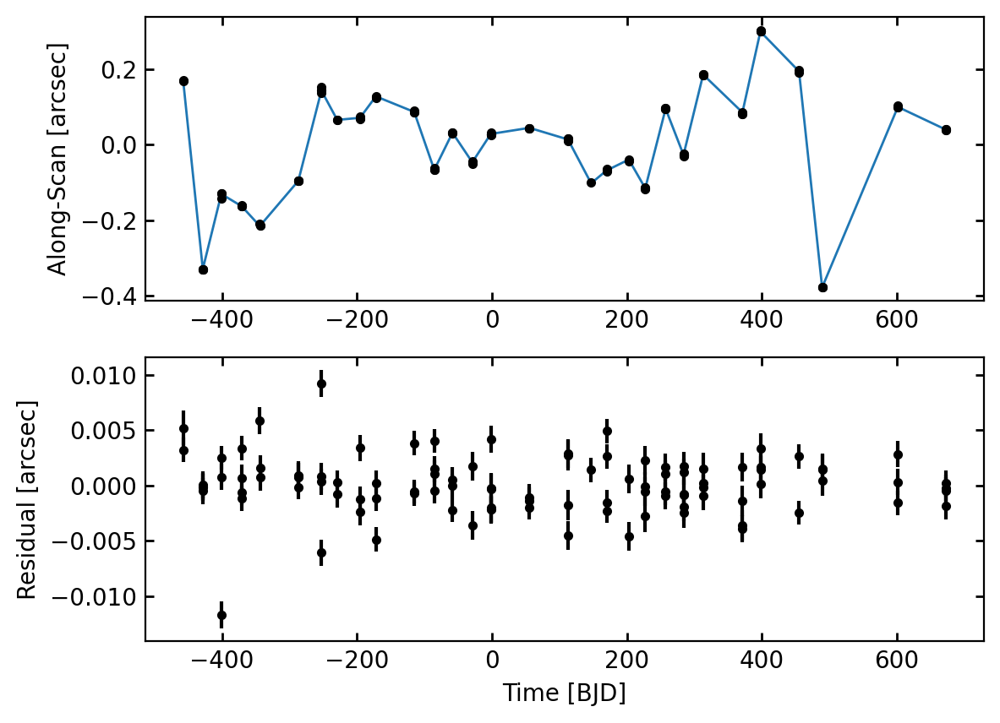

In [246]:
plt.figure()

plt.subplot(2,1,1)
plt.errorbar(t, w+tot_meansoln, yerr=sig_w, fmt='o', ms=3, c='k')
plt.plot(t, opt_params['model_single'] + opt_params['model_binary'], lw=1)

plt.ylabel('Along-Scan [arcsec]')

plt.subplot(2,1,2)
plt.errorbar(t, w-opt_params['model_single']-opt_params['model_binary']+tot_meansoln, yerr=sig_w, fmt='o', ms=3, c='k')

plt.xlabel('Time [BJD]')
plt.ylabel('Residual [arcsec]')

plt.show()

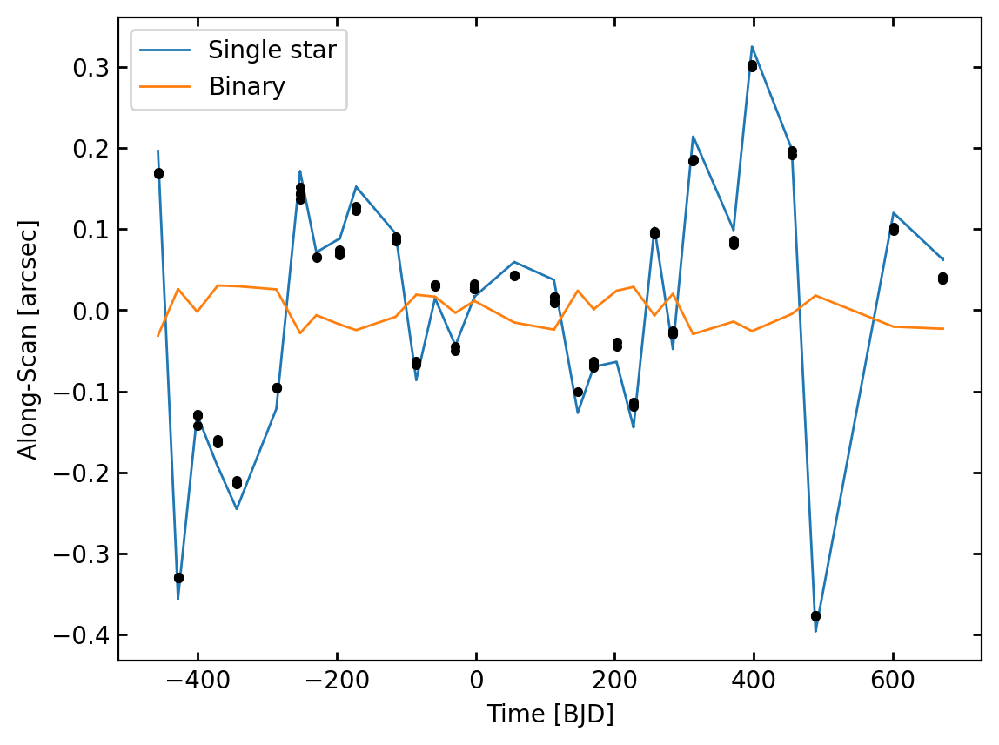

In [247]:
plt.figure()

plt.errorbar(t, w+tot_meansoln, yerr=sig_w, fmt='o', ms=3, c='k')

plt.plot(t, opt_params['model_single'], lw=1, label='Single star')
plt.plot(t, opt_params['model_binary'], lw=1, label='Binary')

plt.ylabel('Along-Scan [arcsec]')
plt.xlabel('Time [BJD]')

plt.legend()

plt.show()

In [248]:
sampler_wn = infer.MCMC(
    infer.NUTS(
        model,
        target_accept_prob=0.8,
        dense_mass=True,
        init_strategy=infer.init_to_value(values=opt_params),
        regularize_mass_matrix=False,
    ),
    num_warmup=4000,
    num_samples=8000,
    num_chains=2,
    progress_bar=True,
)
%time sampler_wn.run(jax.random.PRNGKey(11), t, pf, spsi,cpsi, w+tot_meansoln, sig_w)

/var/folders/4b/sq0slnz147sfy_kz1_nwf6zh0000gn/T/ipykernel_14994/3315277478.py:1: UserWarning: There are not enough devices to run parallel chains: expected 2 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(2)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  sampler_wn = infer.MCMC(
sample: 100%|██████████| 12000/12000 [00:15<00:00, 785.98it/s, 15 steps of size 2.29e-01. acc. prob=0.91]


CPU times: user 37.9 s, sys: 853 ms, total: 38.7 s
Wall time: 38.8 s


In [249]:
import arviz as az
inf_data_wn = az.from_numpyro(sampler_wn)
x = az.summary(inf_data_wn, var_names=['delta_ra', 'delta_dec', 'pm_ra', 'pm_dec', 'log_parallax', 'parallax', 'log_sigma', 'log_mp', 'mp', 'p', 'ecc', 'omega', 'cosi', 'i','i_ratio', 'long_peri', 'tp'], 
           round_to=8)
print(x)
x.to_csv('summary.csv')

                     mean         sd       hdi_3%      hdi_97%  mcse_mean   
delta_ra         0.003737   0.000941     0.001963     0.005497   0.000009  \
delta_dec       -0.003061   0.001578    -0.005946    -0.000047   0.000013   
pm_ra           -0.072693   0.000890    -0.074400    -0.071052   0.000007   
pm_dec           0.271284   0.001255     0.268851     0.273479   0.000017   
log_parallax    -3.388517   0.012531    -3.412370    -3.364975   0.000104   
parallax         0.033761   0.000423     0.032963     0.034563   0.000003   
log_sigma       -5.929150   0.094583    -6.107130    -5.752604   0.000824   
log_mp          -0.171773   0.106530    -0.364291     0.021361   0.001785   
mp               0.846914   0.089022     0.684919     1.007773   0.001528   
p             1297.413910  12.946186  1273.170172  1321.691603   0.092923   
ecc              0.067207   0.040375    -0.007681     0.142430   0.000388   
omega           -0.120141   0.005729    -0.129499    -0.110801   0.000043   

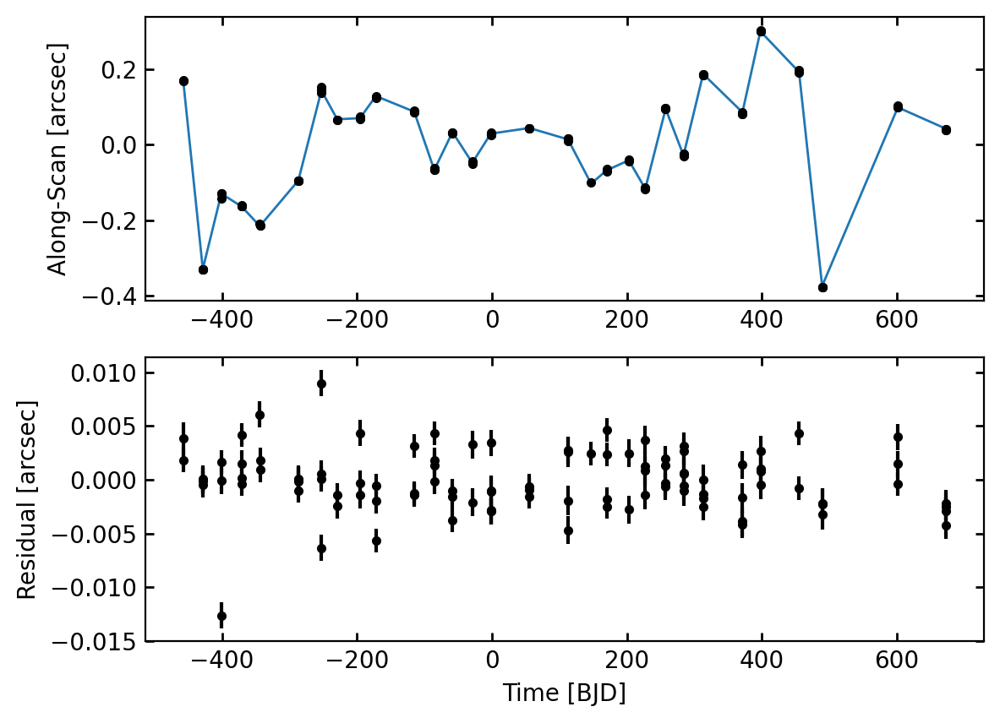

In [167]:
plt.figure()

plt.subplot(2,1,1)
plt.errorbar(t, w+tot_meansoln, yerr=sig_w, fmt='o', ms=3, c='k')

as_pred = inf_data_wn.posterior['model_single'].values + inf_data_wn.posterior['model_binary'].values
q16, q50, q84 = np.percentile(as_pred, [16, 50, 84], axis=(0, 1))

plt.plot(t, q50, lw=1)
plt.fill_between(t, q16, q84, alpha=0.3)

plt.ylabel('Along-Scan [arcsec]')

plt.subplot(2,1,2)
plt.errorbar(t, w-q50+tot_meansoln, yerr=sig_w, fmt='o', ms=3, c='k')

plt.xlabel('Time [BJD]')
plt.ylabel('Residual [arcsec]')

plt.show()

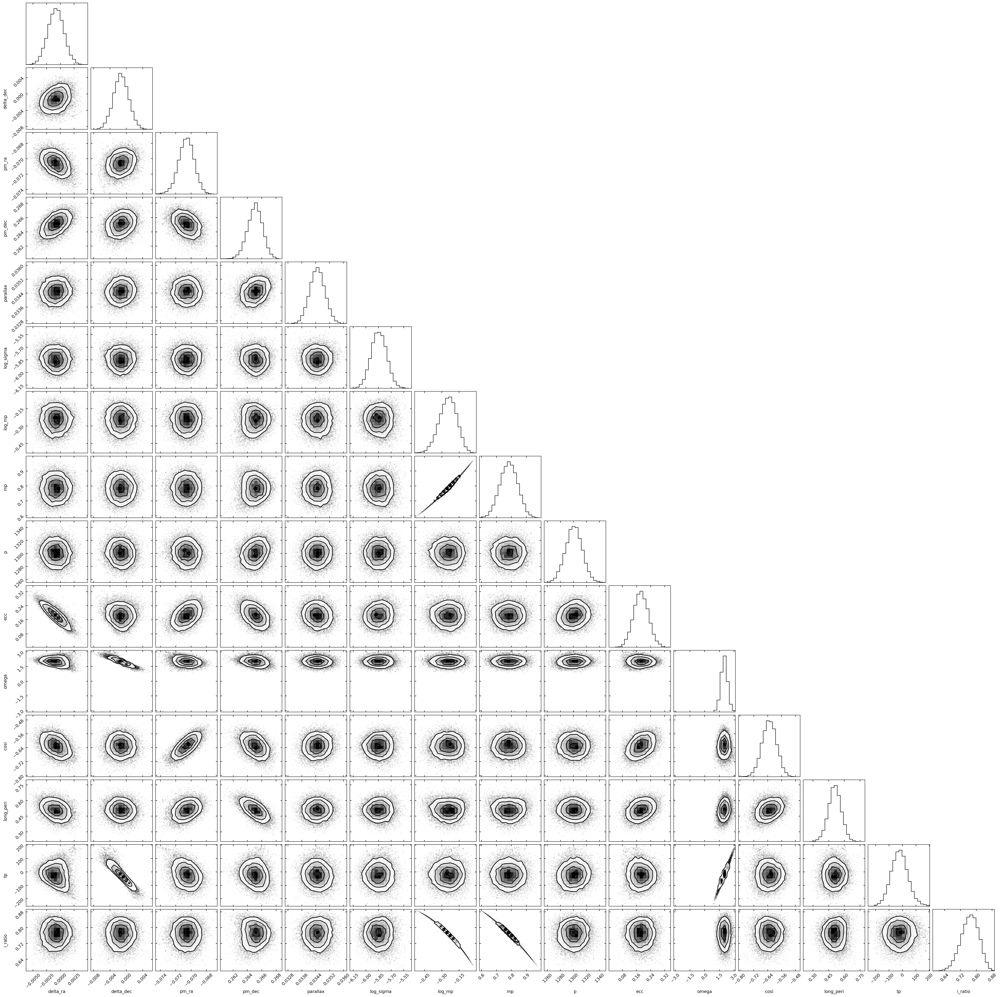

In [168]:
import corner
fig = corner.corner(inf_data_wn.posterior,var_names=['delta_ra', 'delta_dec', 'pm_ra', 'pm_dec', 'parallax', 'log_sigma', 
                         'log_mp', 'mp','p', 'ecc', 'omega', 'cosi', 'long_peri', 'tp','i_ratio']);

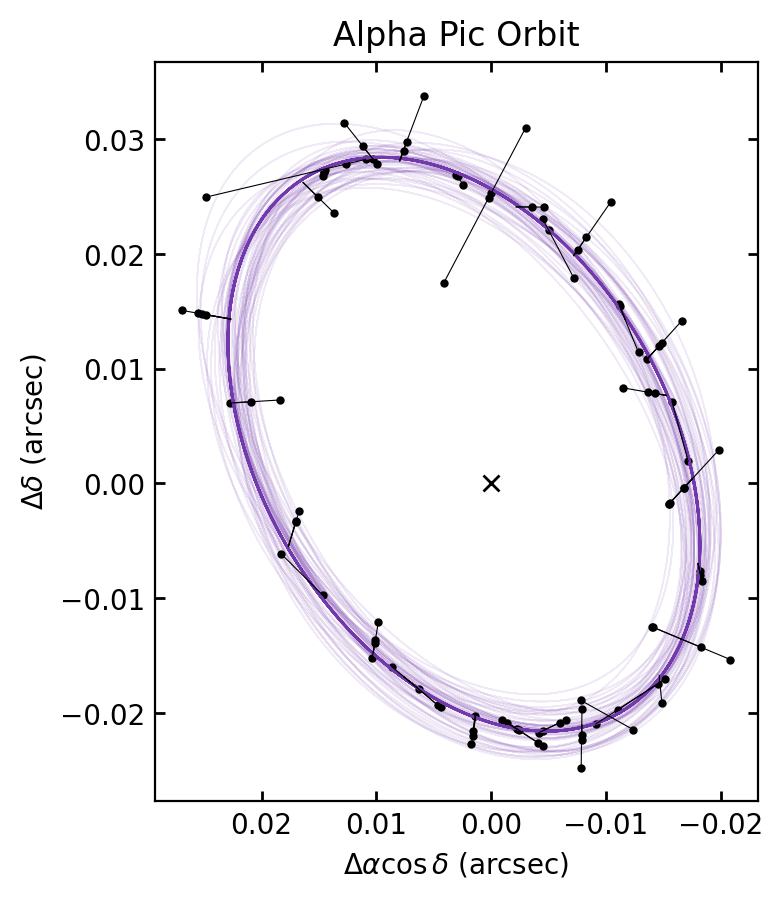

In [203]:
fig = plt.figure()

plt.plot(0, 0, marker='x', c='k')

ra_plot = inf_data_wn.posterior['ra_plot'].values
dec_plot = inf_data_wn.posterior['dec_plot'].values
# 300 draws from the posterior
for i in range(50):
    m = np.random.randint(0, ra_plot.shape[0])
    n = np.random.randint(0, ra_plot.shape[1])
    plt.plot(ra_plot[m,n,:], dec_plot[m,n,:], lw=0.5, c="#7139AC", alpha=0.1)

# plot "data"

jitter = np.exp(np.median(inf_data_wn.posterior.log_sigma.values.flatten()))
delta_ra_mean = np.median(inf_data_wn.posterior.delta_ra.values.flatten())
delta_dec_mean = np.median(inf_data_wn.posterior.delta_dec.values.flatten())
pm_ra_mean = np.median(inf_data_wn.posterior.pm_ra.values.flatten())
pm_dec_mean = np.median(inf_data_wn.posterior.pm_dec.values.flatten())
plx_mean = np.median(inf_data_wn.posterior.parallax.values.flatten())

tot_meanposition = single_star_soln(t, delta_ra_mean, delta_dec_mean, pm_ra_mean, pm_dec_mean, plx_mean, pf, spsi, cpsi)
mean_data = w+tot_meansoln-tot_meanposition

as_pred_total = inf_data_wn.posterior['model_single'].values + inf_data_wn.posterior['model_binary'].values
q16_total, q50_total, q84_total = np.percentile(as_pred, [16, 50, 84], axis=(0, 1))
total_residual = w-q50_total+tot_meansoln

mean_ra_data = total_residual*spsi + np.median(inf_data_wn.posterior.ra.values,axis=[1,0])
mean_dec_data = total_residual*cpsi + np.median(inf_data_wn.posterior.dec.values,axis=[1,0])
plt.plot(mean_ra_data, mean_dec_data, marker='o', linestyle=' ', c='k', ms=2)
fine_t = np.linspace(0,5000,5000)
mean_ms = 1.6
means = az.summary(inf_data_wn, var_names=['delta_ra', 'delta_dec', 'pm_ra', 'pm_dec', 'log_parallax', 'parallax', 'log_sigma', 'log_mp', 'mp', 'p', 'ecc', 'omega', 'cosi', 'i','i_ratio', 'long_peri', 'tp'])['mean']
mper, mtp, mi, mecc, momega, mcosi, mlong_peri, mmp,mi_ratio = means['p'], means['tp'], means['i'], means['ecc'], means['omega'], means['cosi'], means['long_peri'], means['mp'],means['i_ratio']
host = Central(mass=mean_ms,radius=1.0)
msystem = System(host).add_body(period=mper,mass=mmp,time_peri=mtp,inclination=mi,eccentricity=mecc,omega_peri=momega,asc_node=mlong_peri,parallax=plx_mean)
ra_fine, dec_fine, _ = msystem.central_position(fine_t)
plt.plot(dec_fine.magnitude[0]*mi_ratio,ra_fine.magnitude[0]*mi_ratio, c="#7139AC",lw=1)
for i in range(len(t)):
    this_ra = inf_data_wn.posterior.ra.values[:,:,i].flatten()
    this_dec = inf_data_wn.posterior.dec.values[:,:,i].flatten()

    # median position and uncertainty out of model
    med_ra = np.median(this_ra)
    med_dec = np.median(this_dec)

    sd_ra = np.sqrt(sig_w[i]**2 + jitter**2)*spsi[i]
    sd_dec = np.sqrt(sig_w[i]**2 + jitter**2)*cpsi[i]
    plt.plot([mean_ra_data[i], med_ra], [mean_dec_data[i], med_dec], c='k', lw=0.4)      
    #plt.plot([med_ra - sd_ra, med_ra + sd_ra], [med_dec - sd_dec, med_dec + sd_dec], c='k', lw=0.5)      
    #plt.plot(med_ra, med_dec, marker='o', linestyle=' ', c='r', ms=2)

plt.xlabel('$\Delta\\alpha \cos \delta$ (arcsec)')
plt.ylabel('$\Delta \delta$ (arcsec)')
plt.gca().invert_xaxis()
plt.gca().set_aspect('equal')
plt.title('Orbit')
plt.savefig('alpha_pic_orbit1.png', dpi=300,bbox_inches='tight')
#plt.legend()
plt.title('Alpha Pic Orbit')
plt.savefig('alpha_pic_orbit.png', dpi=300,bbox_inches='tight')

In [122]:
az.summary(inf_data_wn, var_names=['delta_ra', 'delta_dec', 'pm_ra', 'pm_dec', 'log_parallax', 'parallax', 'log_sigma', 'log_mp', 'mp', 'p', 'ecc', 'omega', 'cosi', 'i','i_ratio', 'long_peri', 'tp'], 
           round_to=8)


In [72]:

fine_ra = np.median(inf_data_wn.posterior.ra_plot.values, axis=[1,0])
fine_dec = np.median(inf_data_wn.posterior.dec_plot.values, axis=[1,0])

array([[[-0.01165134, -0.01188694, -0.01210623, ..., -0.00105838,
         -0.00151299, -0.00196642],
        [-0.01578541, -0.01587143, -0.01593992, ...,  0.01027497,
          0.00986384,  0.00944884],
        [-0.01658866, -0.01670543, -0.0168057 , ..., -0.00807576,
         -0.00856416, -0.0090432 ],
        ...,
        [-0.01565234, -0.01576437, -0.01585668, ...,  0.00246324,
          0.00195341,  0.00144235],
        [-0.01518223, -0.01527318, -0.01534447, ...,  0.00900855,
          0.0085363 ,  0.00805911],
        [-0.01673204, -0.01680098, -0.01685258, ..., -0.00342598,
         -0.00394056, -0.00445189]],

       [[-0.01472132, -0.01477757, -0.0148127 , ...,  0.00457353,
          0.00402513,  0.00347314],
        [-0.01555027, -0.01562593, -0.01568467, ...,  0.00168976,
          0.00116018,  0.00062955],
        [-0.01562311, -0.01569711, -0.01575237, ..., -0.00320577,
         -0.00370873, -0.00420857],
        ...,
        [-0.01666102, -0.01676182, -0.01684673, ...,  

In [103]:
phase_time = (jnp.linspace(0,5000,1000) % 1300.) /1300.
phase_sort = np.argsort(phase_time)
fine_ra = np.median(inf_data_wn.posterior.ra_plot.values, axis=[1])
fine_dec = np.median(inf_data_wn.posterior.dec_plot.values, axis=[1])
plt.plot(phase_time[phase_sort], fine_ra[phase_sort], c='r', lw=1)
#plt.plot(jnp.linspace(0,5000,1000), fine_dec, c='b', lw=1)

IndexError: index 520 is out of bounds for axis 0 with size 2

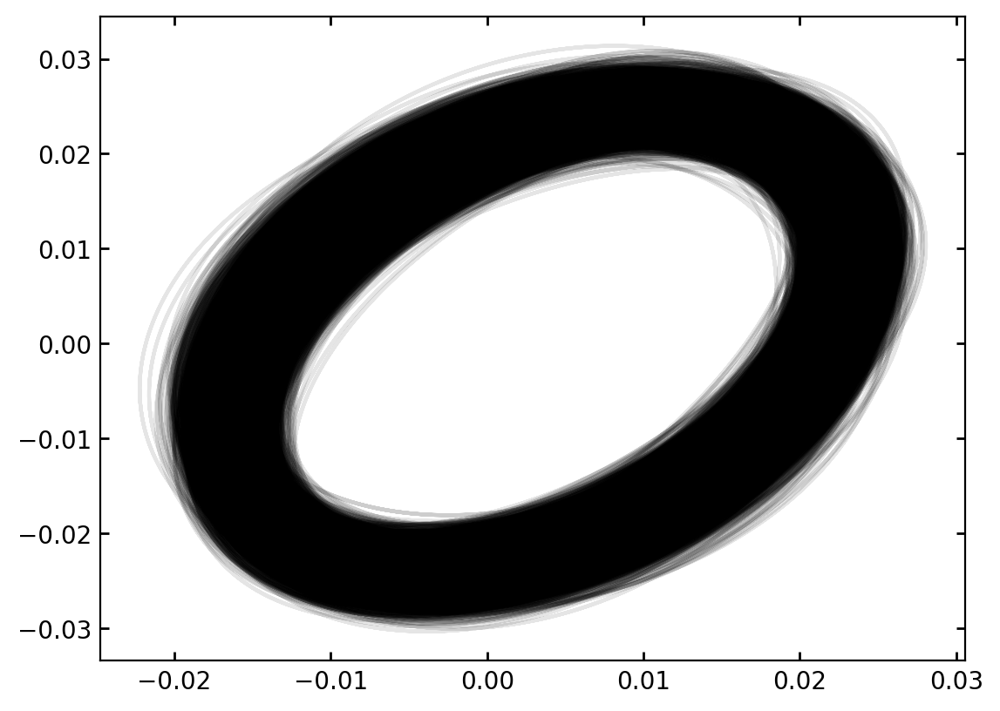

In [106]:
for i in range(8000):
    plt.plot(inf_data_wn.posterior.ra_plot.values[0,i,:], inf_data_wn.posterior.dec_plot.values[0,i,:], c='k', alpha=0.1)
    plt.plot(inf_data_wn.posterior.ra_plot.values[1,i,:], inf_data_wn.posterior.dec_plot.values[1,i,:], c='k', alpha=0.1)

In [101]:
np.median(inf_data_wn.posterior.ra_plot.values, axis=[1])

(2, 1000)

In [19]:
tp = np.random.normal(np.median(inf_data_wn.posterior.tp.values)+t0,np.std(inf_data_wn.posterior.tp.values),1000)
per = np.random.normal(np.median(inf_data_wn.posterior.p.values),np.std(inf_data_wn.posterior.p.values),1000)
ptv_per = np.random.normal(np.exp(7.17),13,1000)
as_tp, as_tp_std = np.mean(tp+6*per),np.std(tp+6*per)
as_tp, as_tp_std

(2456129.471190751, 98.09395754636785)

In [20]:
ptv_phi = np.random.normal(-2.73,0.09,1000)
t_peri_ptv = ((ptv_phi/(2*np.pi)))*ptv_per + 2457000
ptv_tp, ptv_tp_std = np.mean(t_peri_ptv),np.std(t_peri_ptv)
ptv_tp, ptv_tp_std

(2456435.447370763, 19.332282826522043)

In [21]:
np.mean((ptv_phi/(2*np.pi))),np.std((ptv_phi/(2*np.pi)))

(-0.4342567163770164, 0.01429360283313876)

In [22]:
np.mean((ptv_phi/(2*np.pi))),np.std((ptv_phi/(2*np.pi)))

(-0.4342567163770164, 0.01429360283313876)

In [23]:

mass_func = ((0.9)**3 * np.sin(2.271134)**3)/((0.9+1.6)**2)
asini = ((((1500*24*60*60)**2 * 6.67e-11 * (mass_func*1.989e30)*((1-0.30**2)**(3/2)))/(4*jnp.pi**2))**(1/3))/(2.99792e8)
asini

456.00372749809554

In [24]:
np.mean(((t_peri_ptv - t0) - 6*ptv_per)/ptv_per),np.std(((t_peri_ptv - t0) - 6*ptv_per)/ptv_per)

(0.22094862461436093, 0.06718523191583511)

In [25]:
def get_time_delay(time, period, phi, lighttime, eccen=None):
    """Calculates the time delay for the given time values.
    
    Args:
        time (array): Time values at which to calculate tau.
    
    Returns:
        array: Time delay values for each `time`
    """
    # Mean anom
    M = 2.0 * np.pi * time / period - phi

    # Negative psi to agree with Hey+2019. Implies closest star has negative
    # time delay
    if eccen is None:
        psi = -np.sin(M)
    else:
        psi = (
            -1
            * (1 - np.square(eccen))
        )

    tau = (lighttime / 86400) * psi[:, None]
    return tau

In [26]:
get_time_delay(np.array([1]),np.array([1300]),np.array([-2.73]),np.array([5000]),np.array([0.36]))

array([[-0.05037037]])

In [27]:
import astropy.constants as const
import astropy.units as u
def mass_function(period, asini):
    """Calculates the mass function for a given system
    
    Args:
        period (astropy.units.quantity.Quantity): Orbital period
        asini (astropy.units.quantity.Quantity): Convolved semi-major axis
    
    Returns:
        astropy.units.quantity.Quantity: Mass function in M_sun
    """
    si = (
        (4 * np.pi ** 2 * (1 * const.c ** 3))
        / (1 * const.G)
        * 1
        / (period.to(u.s) ** 2)
        * (asini ** 3)
    )
    return si.to(u.M_sun)
mass_function(1300*u.day,555*u.s)

<Quantity 0.10861129 solMass>

In [28]:
mp = 0.9
ms = 1.6
1.0 - (((mp/ms)**3.5)*(1+mp/ms))/((mp/ms)*(1. + (mp/ms)**3.5))

0.6728770663938399